# **`STABLE DIFFUSION XL `**

In [ ]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate

In [2]:
import torch
from diffusers import StableDiffusionXLPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
pipeline = StableDiffusionXLPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True).to("cuda")

  0%|          | 0/50 [00:00<?, ?it/s]

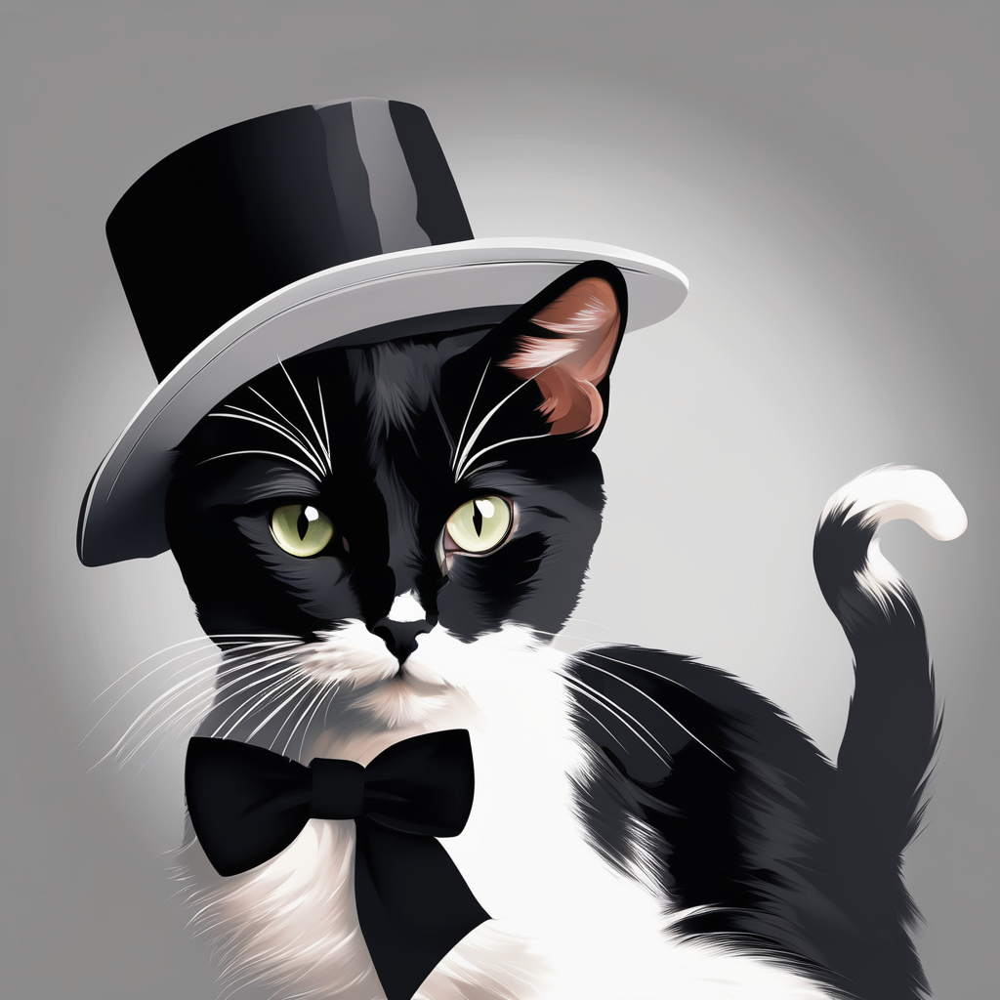

In [4]:
generator = torch.Generator(device="cuda").manual_seed(30)

prompt = "Black white cat with a hat, digital art"
negative_prompt = "ugly, distorted face, poor details, deformed, big nose, bad art, poorly drawn feet, poorly drawn face, watermark, text, signature, missing arms, missing legs, lying down"

image = pipeline(prompt=prompt, negative_prompt=negative_prompt, generator=generator, guidance_scale=7.5).images[0]

image

  0%|          | 0/50 [00:00<?, ?it/s]

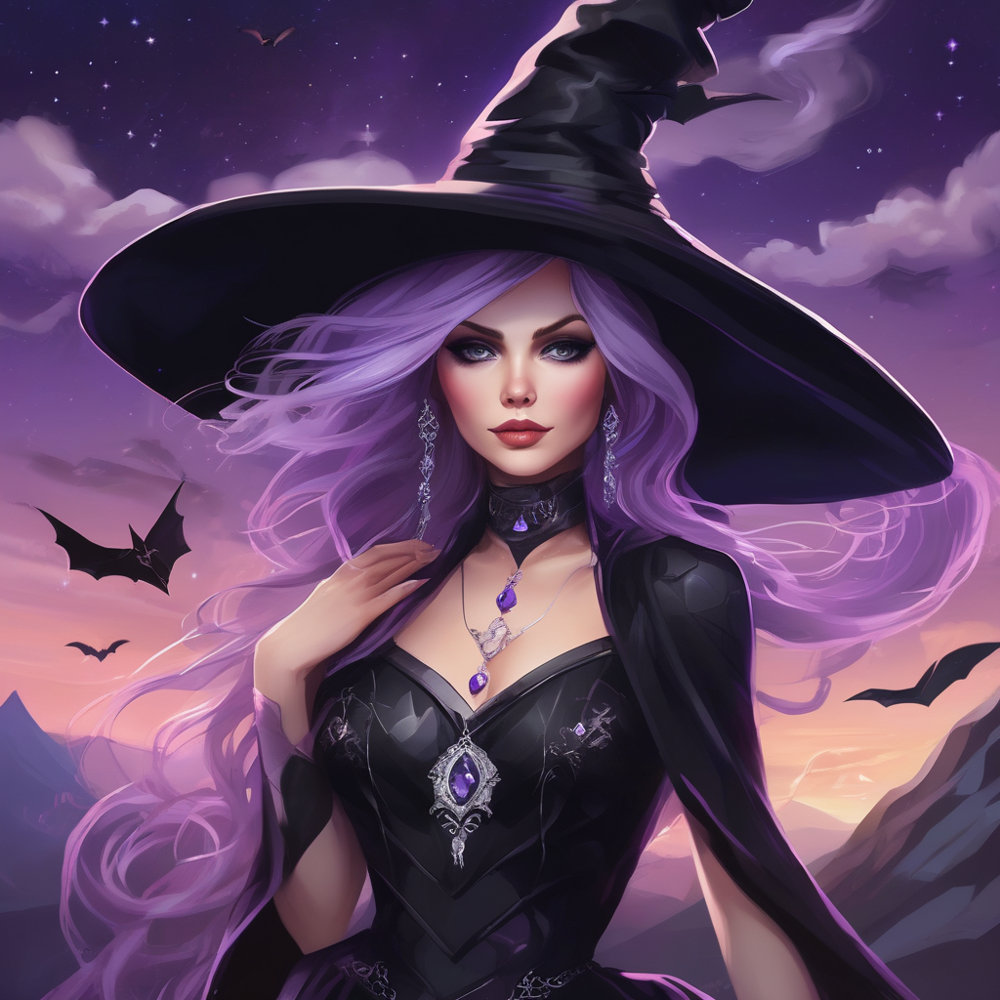

In [5]:
generator = torch.Generator(device="cuda").manual_seed(286773456)

STYLE = "futuristic, fantasy"
RESOLUTION = "highly detailed, "
LIGHTING = "surrounded by clouds at night, "
prompt = "Portrait of a beautiful and powerful witch, wearing a black dress with gemstones, serious eyes, small face, white with highlighted purple hair, windy, witch hat, bats, mountain background" + RESOLUTION + LIGHTING + STYLE

negative_prompt = "ugly, distorted, deformed, mutation, out of frame"

image = pipeline(prompt=prompt, negative_prompt=negative_prompt, generator=generator).images[0]

image

We can take a look some hyperparameters. One of them is **negative_original_size**. Let's see the effect of it to the images :)


  0%|          | 0/50 [00:00<?, ?it/s]

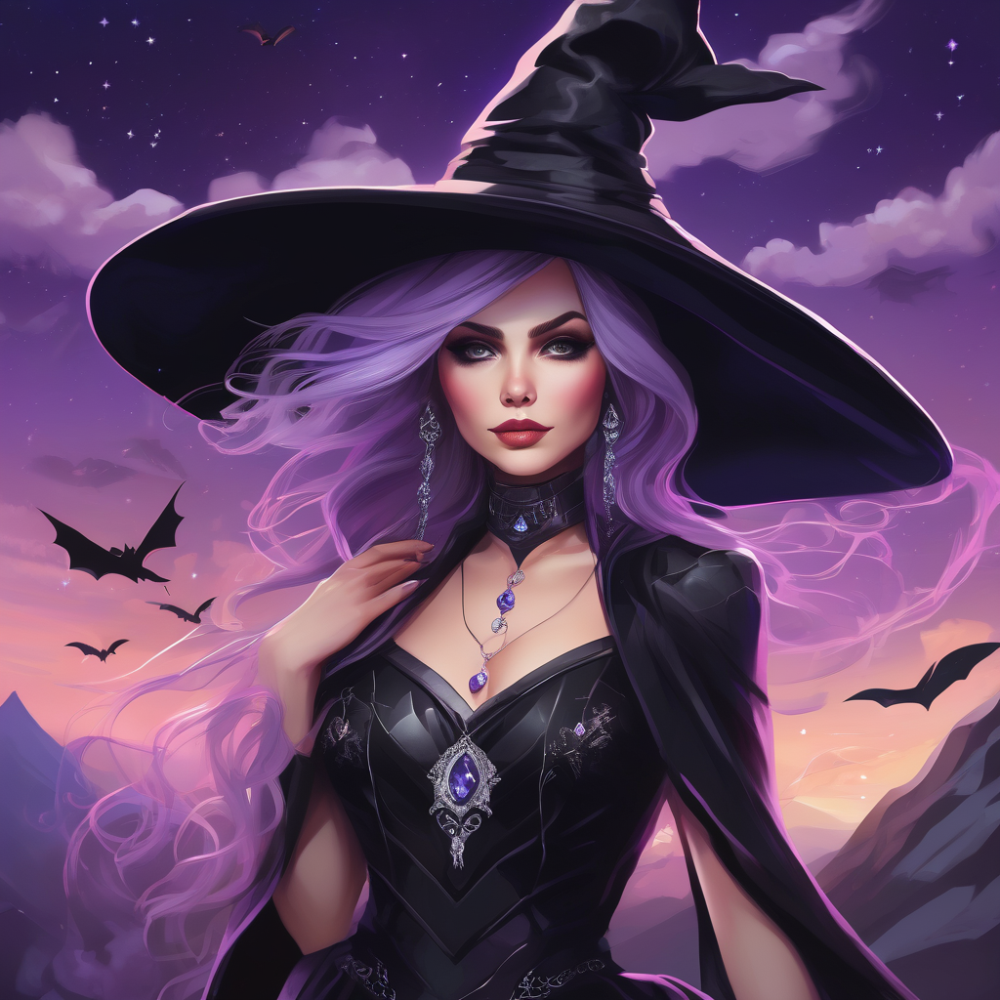

In [6]:
generator = torch.Generator(device="cuda").manual_seed(286773456)

STYLE = "futuristic, fantasy"
RESOLUTION = "highly detailed, "
LIGHTING = "surrounded by clouds at night, "
prompt = "Portrait of a beautiful and powerful witch, wearing a black dress with gemstones, serious eyes, small face, white with highlighted purple hair, windy, witch hat, bats, mountain background" + RESOLUTION + LIGHTING + STYLE

negative_prompt = "ugly, distorted, deformed, mutation, out of frame"

image = pipeline(prompt=prompt,
                 negative_prompt=negative_prompt,
                 negative_original_size=(512, 512),
                 negative_target_size=(1024, 1024),
                 generator=generator).images[0]

image

  0%|          | 0/50 [00:00<?, ?it/s]

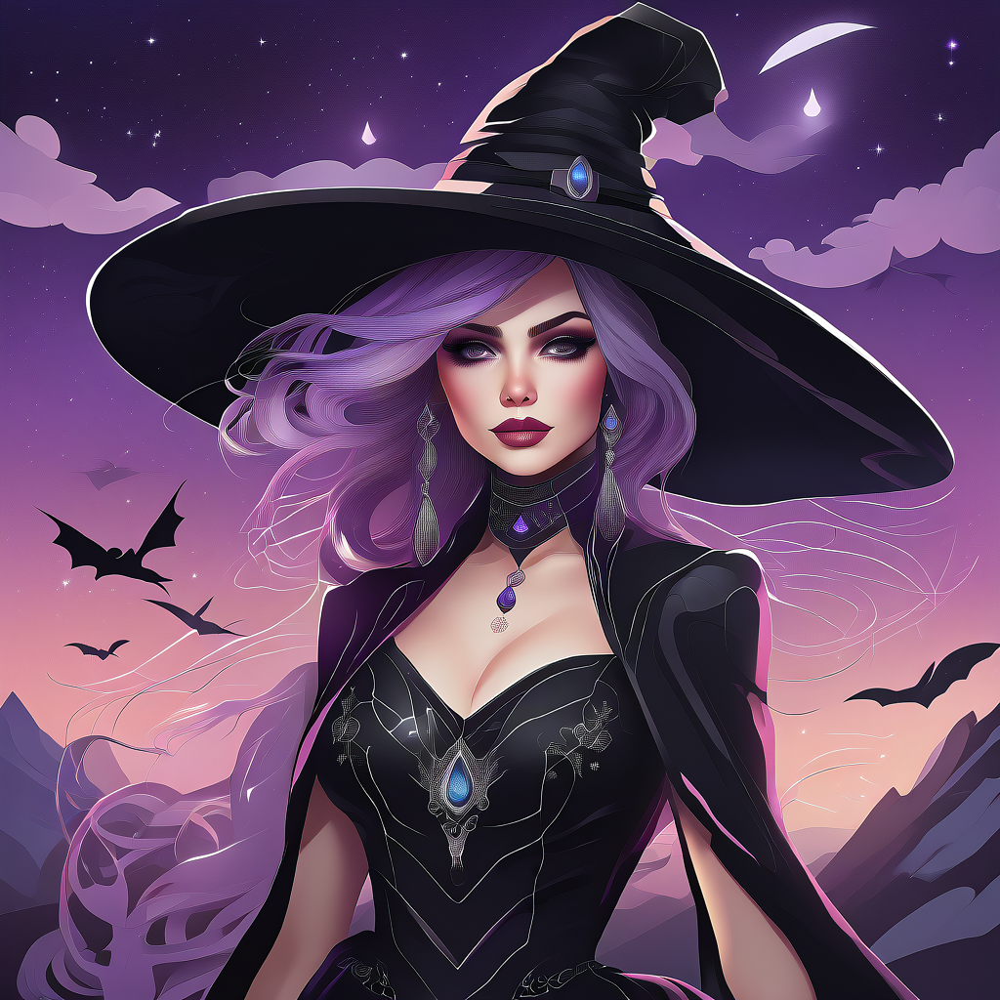

In [7]:
generator = torch.Generator(device="cuda").manual_seed(286773456)

STYLE = "futuristic, fantasy"
RESOLUTION = "highly detailed, "
LIGHTING = "surrounded by clouds at night, "
prompt = "Portrait of a beautiful and powerful witch, wearing a black dress with gemstones, serious eyes, small face, white with highlighted purple hair, windy, witch hat, bats, mountain background" + RESOLUTION + LIGHTING + STYLE

negative_prompt = "ugly, distorted, deformed, mutation, out of frame"

image = pipeline(prompt=prompt,
                 negative_prompt=negative_prompt,
                 negative_original_size=(256, 256),
                 negative_target_size=(1024, 1024),
                 generator=generator).images[0]

image

The other hyperparameters are **prompt_2** and **negative_prompt_2**. SDXL model have two text-encoders, so we can pass different prompts each of them. Let's try it 🚀 Also, I changed the prompt and the prompt_2 in the following codes to see the effects of prompts to the image :)

  0%|          | 0/50 [00:00<?, ?it/s]

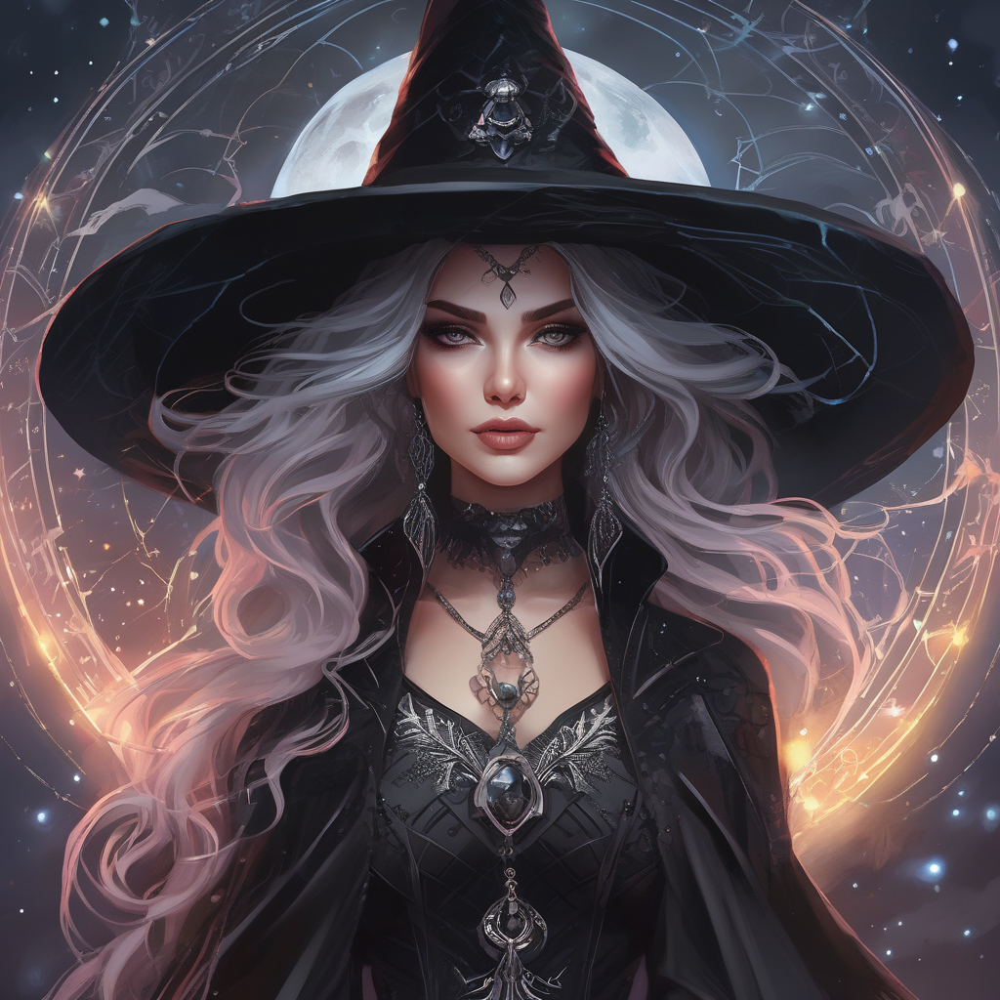

In [18]:
generator = torch.Generator(device="cuda").manual_seed(286773456)

STYLE = "futuristic, fantasy"
STYLE_2 = "cyberpunk"
RESOLUTION = "highly detailed, "
LIGHTING = "surrounded by clouds at night, "

prompt = "Portrait of a beautiful and powerful witch, wearing a black dress with gemstones, serious eyes, small face, white with highlighted purple hair, windy, witch hat, bats, mountain background" + RESOLUTION + LIGHTING + STYLE
prompt_2 = "Portrait of a beautiful and powerful witch" + RESOLUTION + LIGHTING + STYLE_2

negative_prompt = "ugly, distorted, deformed, mutation, out of frame"
negative_prompt_2 = "ugly, distorted, deformed, mutation, out of frame"

image = pipeline(prompt=prompt,
                 prompt_2=prompt_2,
                 negative_prompt=negative_prompt,
                 negative_prompt_2=negative_prompt_2,
                 generator=generator).images[0]

image

  0%|          | 0/50 [00:00<?, ?it/s]

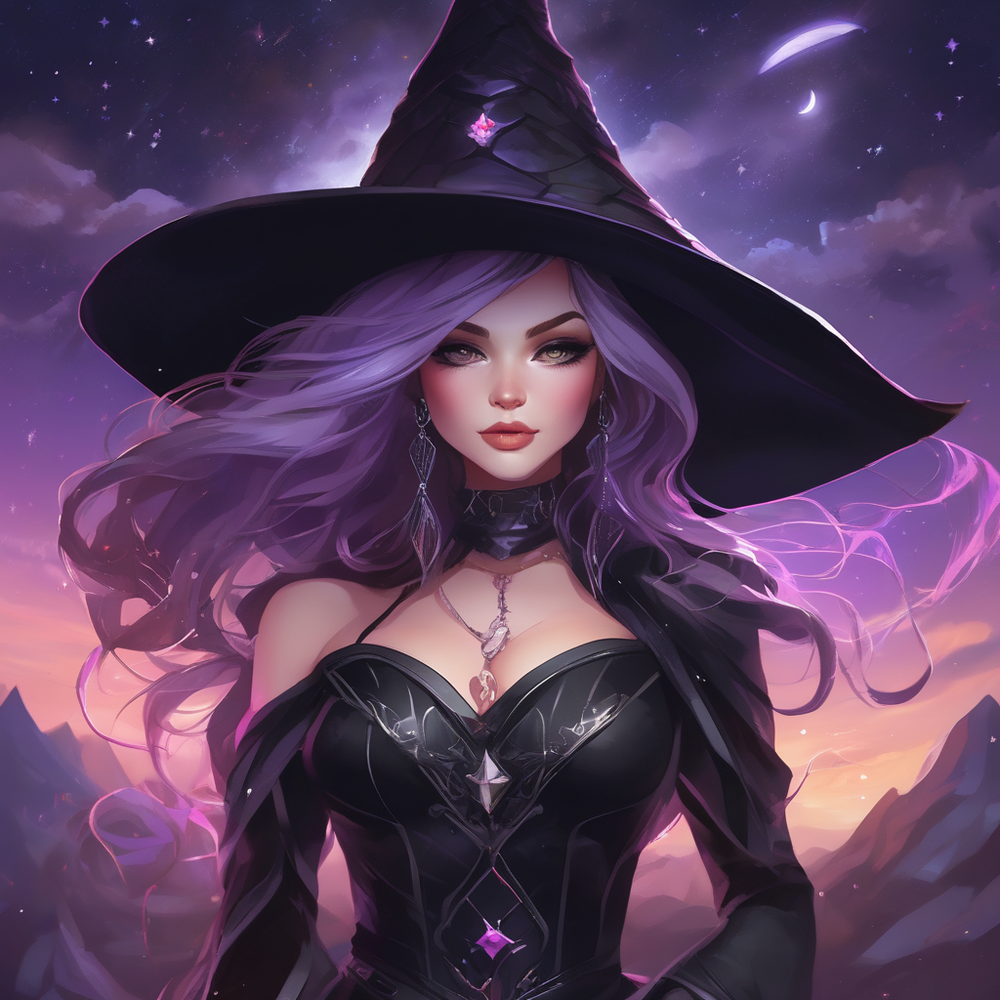

In [19]:
generator = torch.Generator(device="cuda").manual_seed(286773456)

STYLE = "futuristic, fantasy"
STYLE_2 = "cyberpunk"
RESOLUTION = "highly detailed, "
LIGHTING = "surrounded by clouds at night, "

prompt = "Portrait of a beautiful and powerful witch" + RESOLUTION + LIGHTING + STYLE_2
prompt_2 = "Portrait of a beautiful and powerful witch, wearing a black dress with gemstones, serious eyes, small face, white with highlighted purple hair, windy, witch hat, bats, mountain background" + RESOLUTION + LIGHTING + STYLE

negative_prompt = "ugly, distorted, deformed, mutation, out of frame"
negative_prompt_2 = "ugly, distorted, deformed, mutation, out of frame"

image = pipeline(prompt=prompt,
                 prompt_2=prompt_2,
                 negative_prompt=negative_prompt,
                 negative_prompt_2=negative_prompt_2,
                 generator=generator).images[0]

image